In [10]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
from homework_util import RectDrawer, non_max_suppression_fast
import seaborn as sns
import numpy as np


## 1. Image Load 

([], <a list of 0 Text yticklabel objects>)

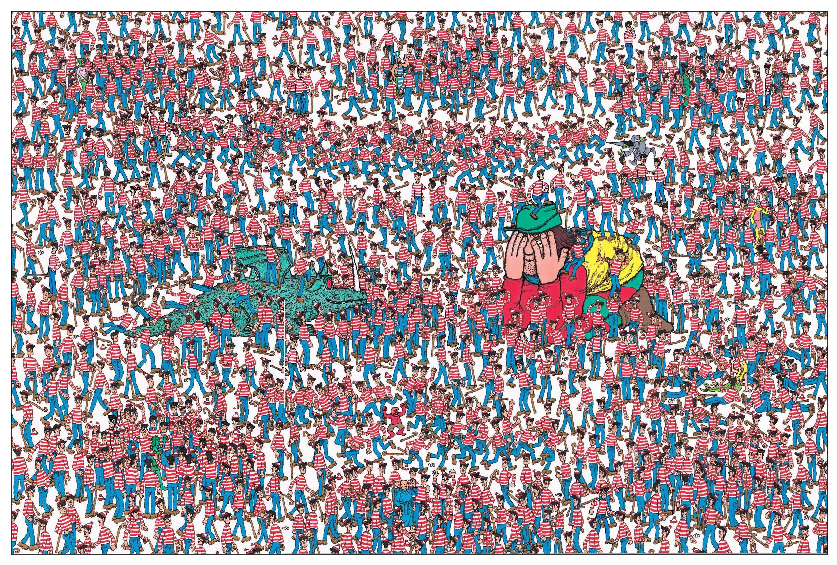

In [11]:
img = cv2.imread('How_many wally.jpg')
plt.figure(figsize=(20,10))
plt.imshow(img[:,:,::-1])
plt.grid(False)
plt.xticks([])
plt.yticks([])

## 2. Get Template

In [13]:
drawer = RectDrawer(img)
# drawer.set_rect()

In [14]:
drawer.rects =[[1172, 469,1210, 556]]

In [15]:
templates = drawer.get_template()          #return template image
temp_rects = np.array(drawer.get_rect())   #return template coordinate(x, y, w, h)

In [16]:
temp_w, temp_h = temp_rects.mean(axis=0).astype('int')[2:]
temp_w, temp_h   # average template width, height

(1210, 556)

## 3. Template Matching

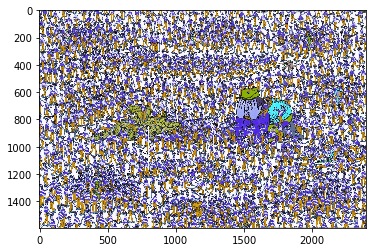

In [17]:
## To do: template matching
plt.imshow(img, cmap = 'gray')

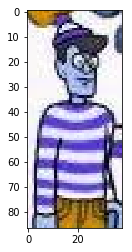

In [18]:
template = img[469:556, 1172:1210]
plt.imshow(template, cmap='gray')

In [19]:
w = 556 - 469
h = 1210- 1172

In [25]:
img2 = img.copy()
# w, h = template.shape[::-1]
# print(w,h)

In [26]:
methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR,
            cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
i=1

In [27]:
img = img2.copy()

# Apply template Matching
res = cv2.matchTemplate(img,template,methods[i])
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
print(min_val, max_val, min_loc, max_loc)

-0.3073999881744385 0.999999463558197 (1277, 609) (1172, 469)


In [28]:
# If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
if methods[i] in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else:
    top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)
print(bottom_right)

(1259, 507)


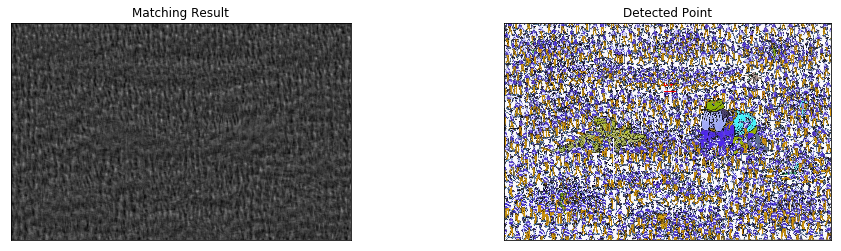

In [29]:
cv2.putText(img, 'Messi', top_left, cv2.FONT_HERSHEY_SIMPLEX, 1, 255,2)
cv2.rectangle(img,top_left, bottom_right, 255, 2)

plt.figure(figsize=(16,4))
plt.subplot(121),plt.imshow(res,cmap = 'gray')
plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img,cmap = 'gray')
plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

plt.show()

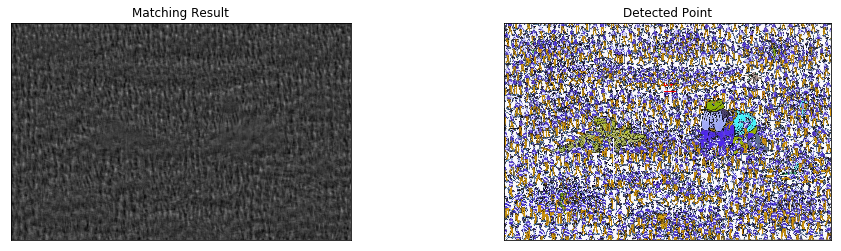

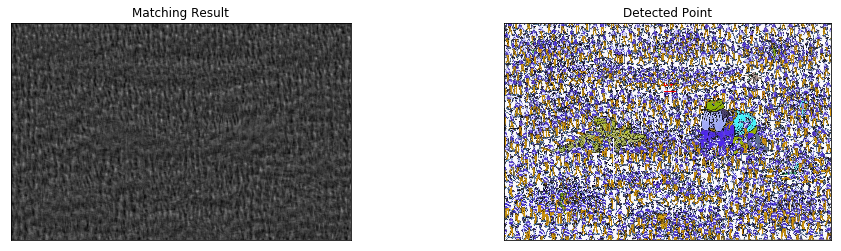

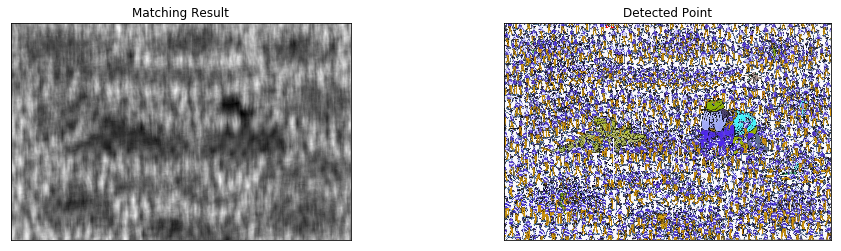

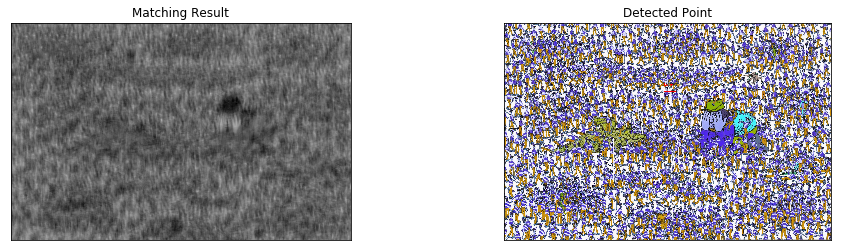

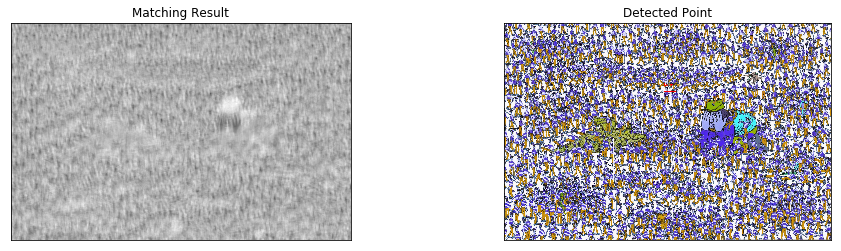

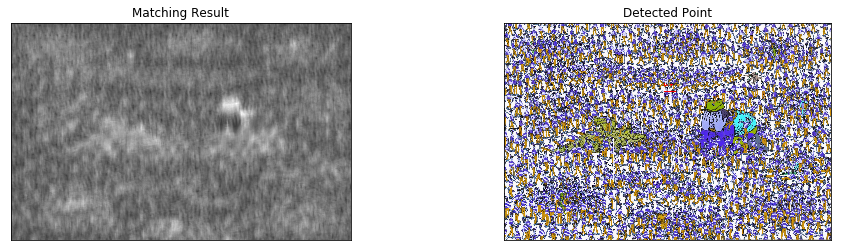

In [30]:
methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR,
            cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]

for method in methods:

    img = img2.copy()

    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.putText(img, 'Messi', top_left, cv2.FONT_HERSHEY_SIMPLEX, 1, 255,2)
    cv2.rectangle(img,top_left, bottom_right, 255, 2)

    plt.figure(figsize=(16,4))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

    plt.show()

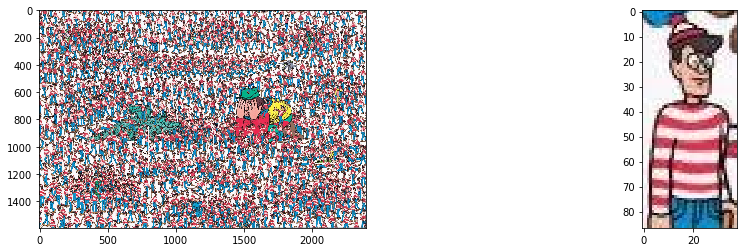

In [31]:
img_bgr = cv2.imread('How_many wally.jpg')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
coin_template = img_rgb[469:556, 1172:1210,:]

plt.figure(figsize=(16,4))
plt.subplot(121)
plt.imshow(img_rgb)
plt.subplot(122)
plt.imshow(coin_template)

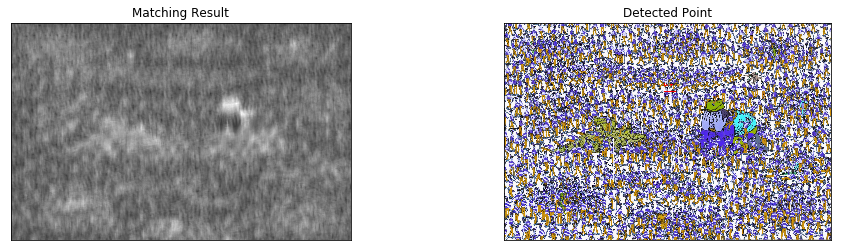

In [32]:
cv2.TM_SQDIFF_NORMED

img = img2.copy()

res = cv2.matchTemplate(img,template,cv2.TM_SQDIFF_NORMED)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

# If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
if cv2.TM_SQDIFF_NORMED in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else:
    top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.putText(img, 'Messi', top_left, cv2.FONT_HERSHEY_SIMPLEX, 1, 255,2)
cv2.rectangle(img,top_left, bottom_right, 255, 2)

plt.figure(figsize=(16,4))
plt.subplot(121),plt.imshow(res,cmap = 'gray')
plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img,cmap = 'gray')
plt.title('Detected Point'), plt.xticks([]), plt.yticks([])

plt.show()

(<matplotlib.axes._subplots.AxesSubplot at 0x2148cd55ac8>,
 <matplotlib.image.AxesImage at 0x2148d2a2550>)

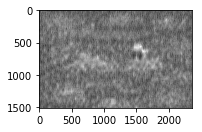

In [35]:
plt.subplot(121),plt.imshow(res,cmap = 'gray')


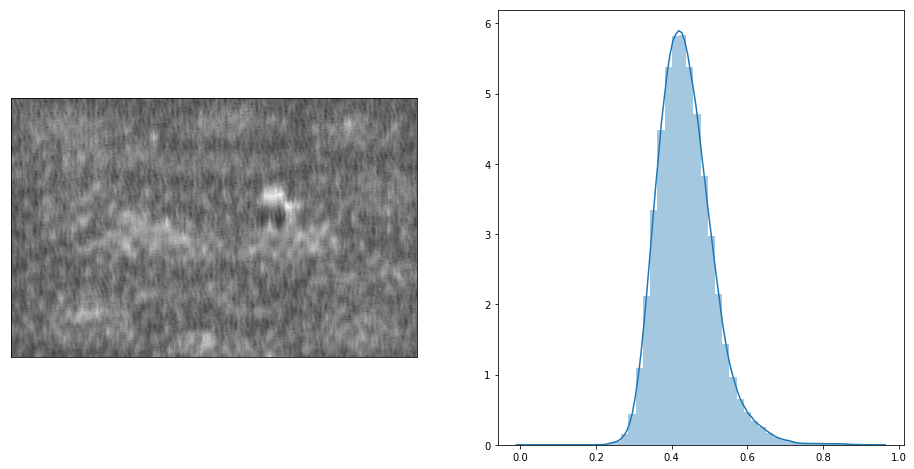

In [36]:
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.imshow(res, cmap='gray')
plt.grid(False)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
sns.distplot(res.reshape(-1))

In [59]:
imsave('/res.png', res)

NameError: name 'imsave' is not defined

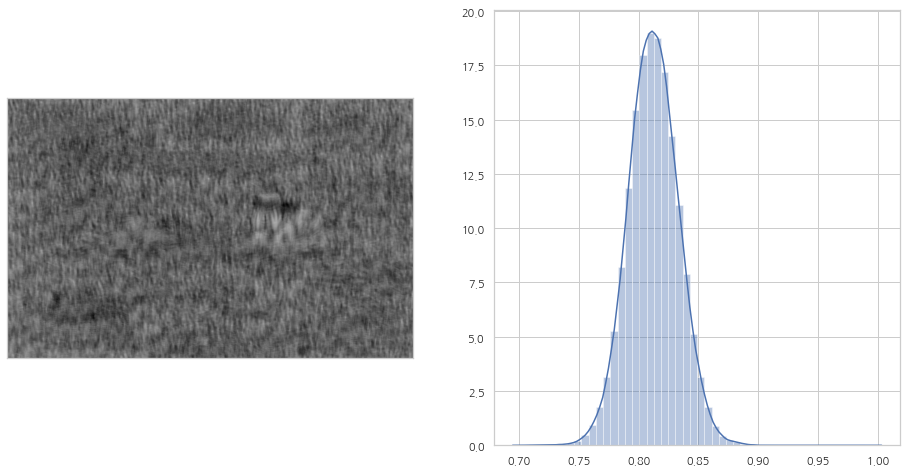

In [293]:
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.imshow(result, cmap='gray')
plt.grid(False)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
sns.distplot(result.reshape(-1))

## 4. Binarization, Thresholding

In [284]:
## To do :  use cv2.threshold

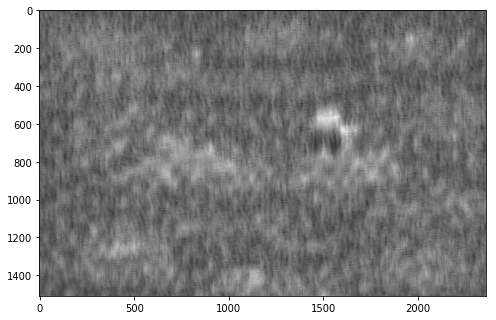

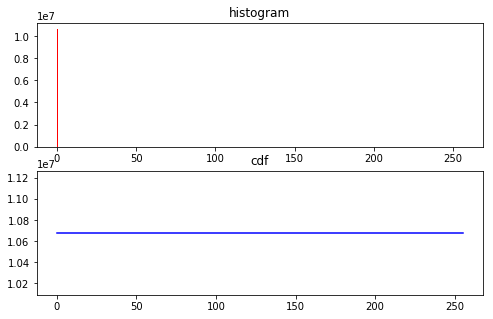

In [37]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# img = cv2.imread('How_many wally.jpg',0)
img = cv2.cvtColor(res, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8,6))
plt.imshow(img) # 이미지 출력

# 히스토그램 구하기
hist,bins = np.histogram(img.flatten(),256,[0,256])

# CDF(누적분포함수) 구하기
cdf = hist.cumsum()

## histogram
plt.figure(figsize=(8,5))
plt.subplot(2,1,1)
plt.title('histogram')
plt.hist(img.flatten(),256,[0,256], color = 'r')

## cdf
plt.subplot(2,1,2),
plt.title('cdf')
plt.plot(cdf, color = 'b')
plt.savefig('histogram_before.png') # 히스토그램 저장
plt.show()


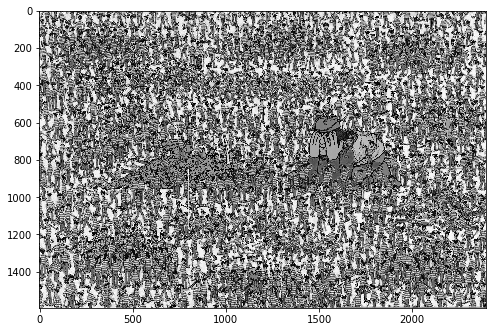

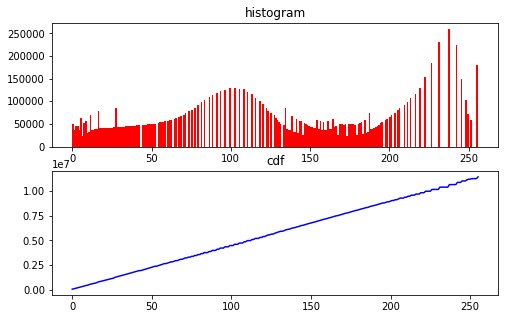

In [72]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()

# cdf의 값이 0인 경우는 mask처리를 하여 계산에서 제외
# mask처리가 되면 Numpy 계산에서 제외가 됨
# 아래는 cdf array에서 값이 0인 부분을 mask처리함
cdf_m = np.ma.masked_equal(cdf,0)

#History Equalization 공식
cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())

# Mask처리를 했던 부분을 다시 0으로 변환
cdf = np.ma.filled(cdf_m,0).astype('uint8')

img2 = cdf[img]
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(8,6))
plt.imshow(img2) # 이미지 출력

## histogram
plt.figure(figsize=(8,5)) 
plt.subplot(2,1,1)
plt.title('histogram')
plt.hist(img2.flatten(),256,[0,256], color = 'r')

## cdf
hist2,bins2 = np.histogram(img2.flatten(),256,[0,256])
cdf2 = hist2.cumsum()

plt.subplot(2,1,2),
plt.title('cdf')
plt.plot(cdf2, color = 'b')
plt.savefig('histogram_after.png') # 히스토그램 저장
plt.show()


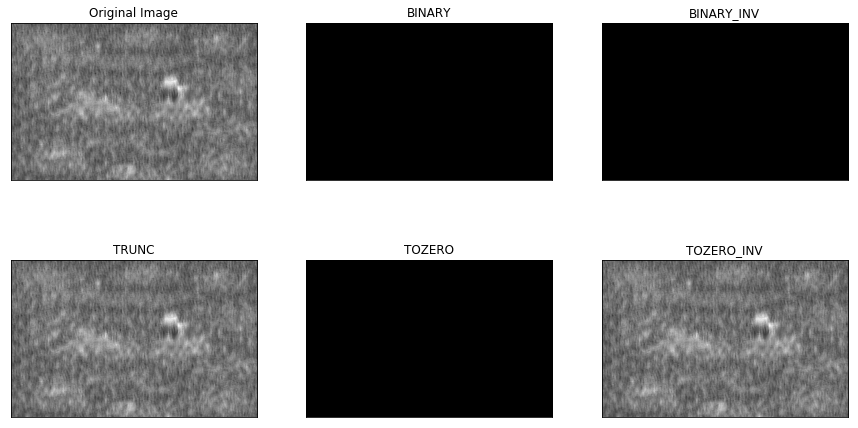

In [45]:

img = res
t = 20

ret,thresh1 = cv2.threshold(img, t, 255, cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img, t, 255, cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img, t, 255, cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img, t, 255, cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img, t, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(15,8)) ## 
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

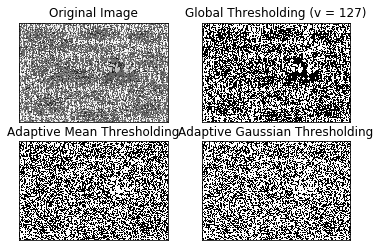

In [131]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)
img = cv2.medianBlur(img,5)

ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

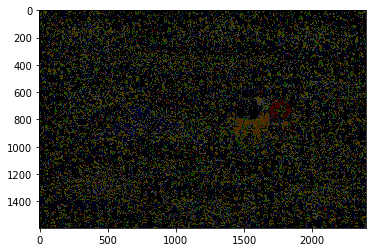

In [129]:
plt.imshow(images[5],'gray')

([], <a list of 0 Text major ticklabel objects>)

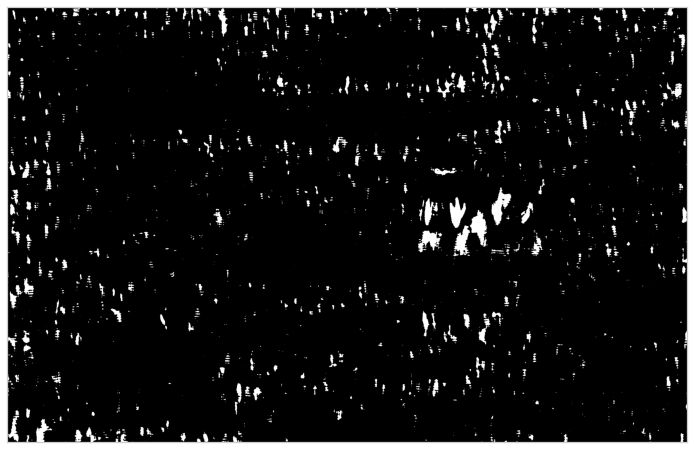

In [285]:
binary = binary.astype('uint8')
plt.figure(figsize=(16,8))
plt.imshow(binary, cmap='gray')
plt.grid(False)
plt.xticks([])
plt.yticks([])

In [50]:
type(res)
res.shape

(1509, 2359)

In [51]:
img_2 = cv2.imread('How_many wally.jpg',0)
type(img_2)
img_2.shape

(1595, 2396)

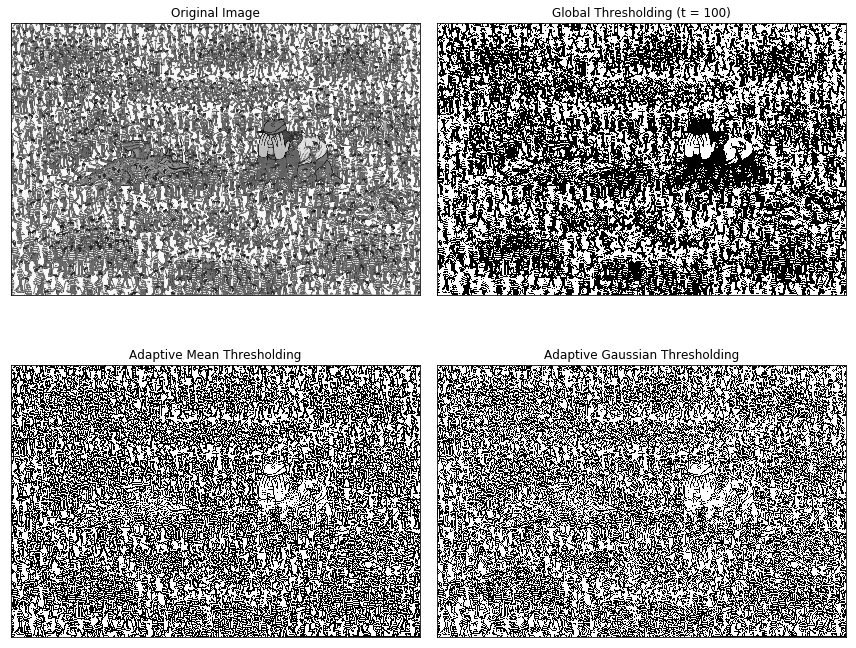

In [47]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)
img = cv2.medianBlur(img,5)



# threshold 값 설정
t = 130

# Global Thresholding
ret,th1 = cv2.threshold(img,t,255,cv2.THRESH_BINARY)

# Adaptive Thresholding(MEAN)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,15,2)

# Adaptive Thresholding(GAUSSIAN)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,15,2)

titles = ['Original Image', 'Global Thresholding (t = 100)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

plt.figure(figsize=(12,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i],'gray') 
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.tight_layout()
plt.show()

In [53]:
grayimg = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


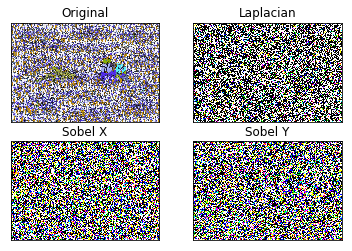

In [53]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg')


laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

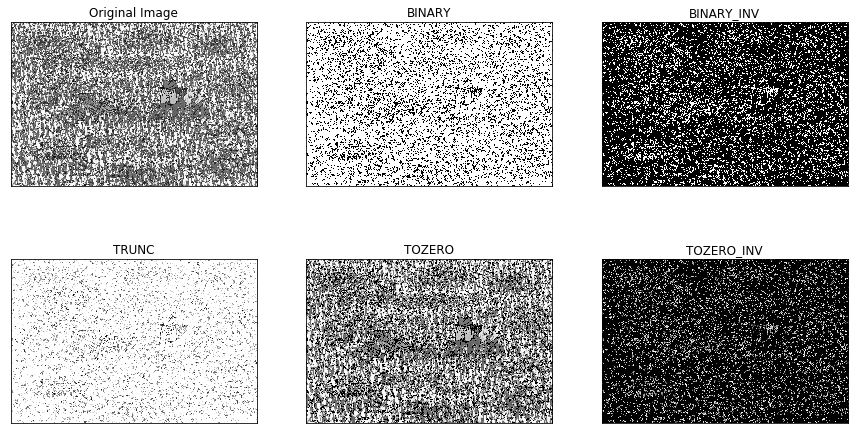

In [110]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

t = 80

ret,thresh1 = cv2.threshold(img, t, 255, cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img, t, 255, cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img, t, 255, cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img, t, 255, cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img, t, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(15,8)) ## 
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

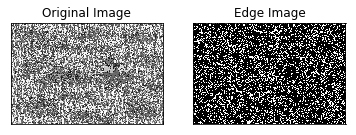

In [133]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

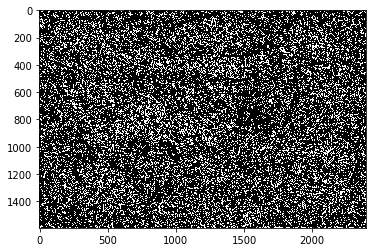

In [135]:
plt.imshow(edges,cmap = 'gray')

In [115]:
img = cv2.imread('How_many wally.jpg',0)

blur = cv2.GaussianBlur(img,(5,5),0)

# find normalized_histogram, and its cumulative distribution function
hist = cv2.calcHist([blur],[0],None,[256],[0,256])
hist_norm = hist.ravel()/hist.max()
Q = hist_norm.cumsum()

bins = np.arange(256)

fn_min = np.inf
thresh = -1

for i in range(1,256):
    p1,p2 = np.hsplit(hist_norm,[i]) # probabilities
    q1,q2 = Q[i],Q[255]-Q[i] # cum sum of classes
    b1,b2 = np.hsplit(bins,[i]) # weights

    # finding means and variances
    m1,m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
    v1,v2 = np.sum(((b1-m1)**2)*p1)/q1,np.sum(((b2-m2)**2)*p2)/q2

    # calculates the minimization function
    fn = v1*q1 + v2*q2
    if fn < fn_min:
        fn_min = fn
        thresh = i

# find otsu's threshold value with OpenCV function
ret, otsu = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
print (thresh,ret)

164 163.0


C:\Users\jk000\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\jk000\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: divide by zero encountered in double_scalars
C:\Users\jk000\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in multiply


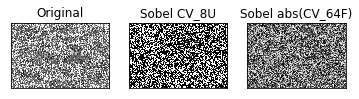

In [116]:
img = cv2.imread('How_many wally.jpg',0)

# Output dtype = cv2.CV_8U
sobelx8u = cv2.Sobel(img,cv2.CV_8U,1,0,ksize=5)

# Output dtype = cv2.CV_64F. Then take its absolute and convert to cv2.CV_8U
sobelx64f = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)

plt.subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(sobelx8u,cmap = 'gray')
plt.title('Sobel CV_8U'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(sobel_8u,cmap = 'gray')
plt.title('Sobel abs(CV_64F)'), plt.xticks([]), plt.yticks([])

plt.show()

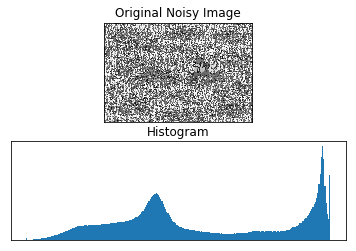

In [121]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
 
img = cv2.imread('How_many wally.jpg',0)
plt.subplot(2,1,1), plt.imshow(img,cmap = 'gray')
plt.title('Original Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(2,1,2), plt.hist(img.ravel(), 256)
plt.title('Histogram'), plt.xticks([]), plt.yticks([])
 
plt.show()

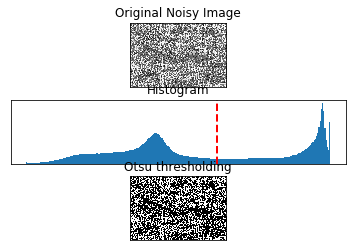

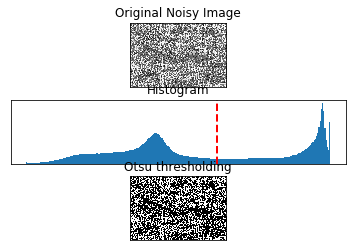

In [123]:

import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)

#ret1, th1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

ret, imgf = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#blur = cv2.GaussianBlur(img, (5,5), 0)
#ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.subplot(3,1,1), plt.imshow(img,cmap = 'gray')
plt.title('Original Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2), plt.hist(img.ravel(), 256)
plt.axvline(x=ret, color='r', linestyle='dashed', linewidth=2)
plt.title('Histogram'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3), plt.imshow(imgf,cmap = 'gray')
plt.title('Otsu thresholding'), plt.xticks([]), plt.yticks([])
plt.show()


import cv2
import numpy as np
from matplotlib import pyplot as plt
 
img = cv2.imread('How_many wally.jpg',0)
 
#ret1, th1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
 
ret, imgf = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
 
#blur = cv2.GaussianBlur(img, (5,5), 0)
#ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
 
plt.subplot(3,1,1), plt.imshow(img,cmap = 'gray')
plt.title('Original Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2), plt.hist(img.ravel(), 256)
plt.axvline(x=ret, color='r', linestyle='dashed', linewidth=2)
plt.title('Histogram'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3), plt.imshow(imgf,cmap = 'gray')
plt.title('Otsu thresholding'), plt.xticks([]), plt.yticks([])
plt.show()
 

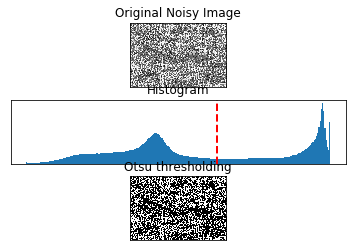

In [124]:

import cv2
import numpy as np
from matplotlib import pyplot as plt
 
img = cv2.imread('How_many wally.jpg',0)
 
ret, imgf = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
 
plt.subplot(3,1,1), plt.imshow(img,cmap = 'gray')
plt.title('Original Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2), plt.hist(img.ravel(), 256)
plt.axvline(x=ret, color='r', linestyle='dashed', linewidth=2)
plt.title('Histogram'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3), plt.imshow(imgf,cmap = 'gray')
plt.title('Otsu thresholding'), plt.xticks([]), plt.yticks([])
plt.show()

In [137]:
import cv2
import numpy as np

img = cv2.imread('How_many wally.jpg')
retval, threshold = cv2.threshold(img, 12, 255, cv2.THRESH_BINARY)
cv2.imshow('original',img)
cv2.imshow('threshold',threshold)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [2]:
import cv2
import numpy as np
img = cv2.imread('How_many wally.jpg')
grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
retval, threshold = cv2.threshold(grayscaled, 10, 255, cv2.THRESH_BINARY)
cv2.imshow('original',img)
cv2.imshow('threshold',threshold)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [4]:
retval2,threshold2 = cv2.threshold(grayscaled,125,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
cv2.imshow('original',img)
cv2.imshow('Otsu threshold',threshold2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [3]:
import cv2
import numpy as np
img = cv2.imread('How_many wally.jpg')
grayscaled = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

th = cv2.adaptiveThreshold(grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
cv2.imshow('original',img)
cv2.imshow('Adaptive threshold',th)
cv2.waitKey(0)
cv2.destroyAllWindows()

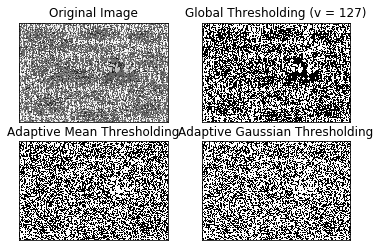

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)
img = cv2.medianBlur(img,5)

ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

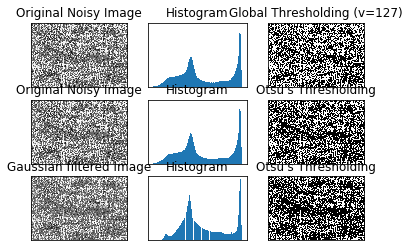

In [8]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('How_many wally.jpg',0)

# global thresholding
ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Otsu's thresholding
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
import cv2
import numpy as np
# img = cv2.imread('How_many wally.jpg',0)

img = cv2.imread("How_many wally.jpg", cv2.IMREAD_GRAYSCALE)

_, threshold_binary = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)
_, threshold_binary_inv = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY_INV)
_, threshold_trunc = cv2.threshold(img, 128, 255, cv2.THRESH_TRUNC)
_, threshold_to_zero = cv2.threshold(img, 12, 255, cv2.THRESH_TOZERO)

cv2.imshow("Image", img)
cv2.imshow("th binary", threshold_binary)
cv2.imshow("th binary inv", threshold_binary_inv)
cv2.imshow("th trunc", threshold_trunc)
cv2.imshow("th to zero", threshold_to_zero)

cv2.waitKey(0)
cv2.destroyAllWindows()

Threshold with Trackbar:

[python]
import cv2
import numpy as np

def nothing(x):
pass

img = cv2.imread("How_many wally.jpg"", cv2.IMREAD_GRAYSCALE)
cv2.namedWindow("Image")
cv2.createTrackbar("Threshold value", "Image", 128, 255, nothing)

while True:
value_threshold = cv2.getTrackbarPos("Threshold value", "Image")
_, threshold_binary = cv2.threshold(img, value_threshold, 255, cv2.THRESH_BINARY)
_, threshold_binary_inv = cv2.threshold(img, value_threshold, 255, cv2.THRESH_BINARY_INV)
_, threshold_trunc = cv2.threshold(img, value_threshold, 255, cv2.THRESH_TRUNC)
_, threshold_to_zero = cv2.threshold(img, value_threshold, 255, cv2.THRESH_TOZERO)
_, threshold_to_zero_inv = cv2.threshold(img, value_threshold, 255, cv2.THRESH_TOZERO_INV)

cv2.imshow("Image", img)
cv2.imshow("th binary", threshold_binary)
cv2.imshow("th binary inv", threshold_binary_inv)
cv2.imshow("th trunc", threshold_trunc)
cv2.imshow("th to zero", threshold_to_zero)
cv2.imshow("th to zero inv", threshold_to_zero_inv)

key = cv2.waitKey(100)
if key == 27:
break

cv2.destroyAllWindows()

([], <a list of 0 Text major ticklabel objects>)

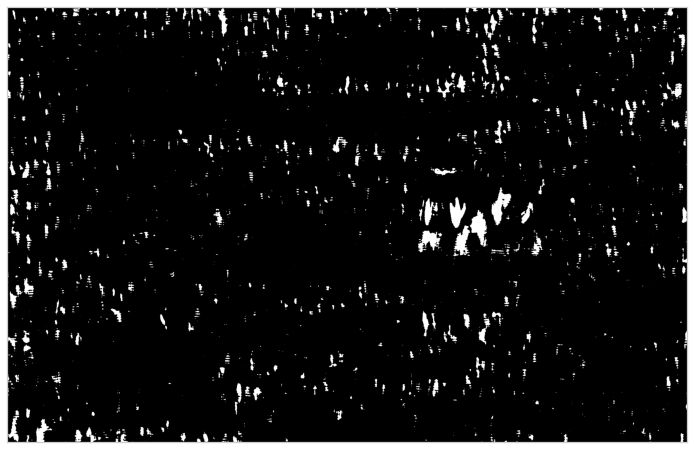

In [285]:
binary = binary.astype('uint8')
plt.figure(figsize=(16,8))
plt.imshow(binary, cmap='gray')
plt.grid(False)
plt.xticks([])
plt.yticks([])

## 5. Find contour

In [286]:
## To do : use cv2.findContours

In [287]:
print(len(contour))
contour[10]

2103


array([[[ 810, 1504]],

       [[ 810, 1507]],

       [[ 811, 1508]],

       [[ 812, 1508]],

       [[ 812, 1507]],

       [[ 813, 1506]],

       [[ 811, 1504]]], dtype=int32)

In [288]:
x=[]
y=[]
for c in contour:
    x.append(c.min(axis=0)[0][0]) 
    y.append(c.min(axis=0)[0][1]) 
x = np.array(x)
y = np.array(y)

In [289]:
rects = np.array([x, y, np.zeros(len(x)) + temp_w, np.zeros(len(x)) + temp_h]).T
print(rects.shape)
rects[:10]

(2103, 4)


array([[ 321., 1508.,   38.,   87.],
       [2230., 1507.,   38.,   87.],
       [ 203., 1507.,   38.,   87.],
       [1683., 1506.,   38.,   87.],
       [1646., 1506.,   38.,   87.],
       [ 756., 1506.,   38.,   87.],
       [ 745., 1506.,   38.,   87.],
       [ 435., 1506.,   38.,   87.],
       [1767., 1505.,   38.,   87.],
       [ 764., 1505.,   38.,   87.]])

## 6. Non-Maximum Suppression

In [290]:
## To do : use non_max_suppression_fast

500
1000


1000

([], <a list of 0 Text major ticklabel objects>)

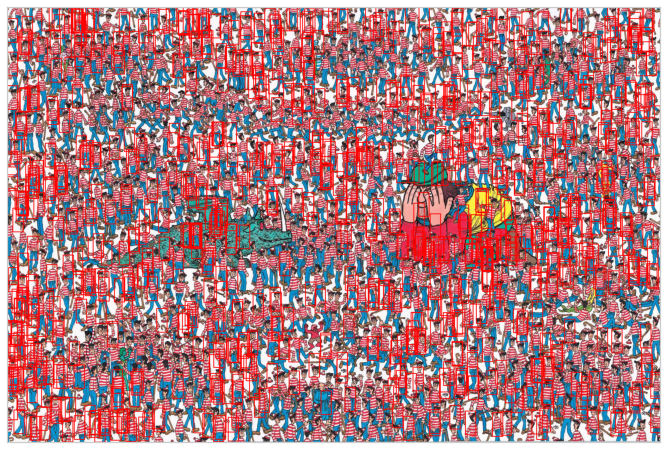

In [291]:
draw = img.copy()

for bbox in bboxes  :
    x,y,w,h = bbox
    cv2.rectangle(draw, (x,y), (x+w, y+h), (0,0,255), 2)
    
plt.figure(figsize=(16,8))
plt.imshow(draw[:,:,::-1])
plt.grid(False)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

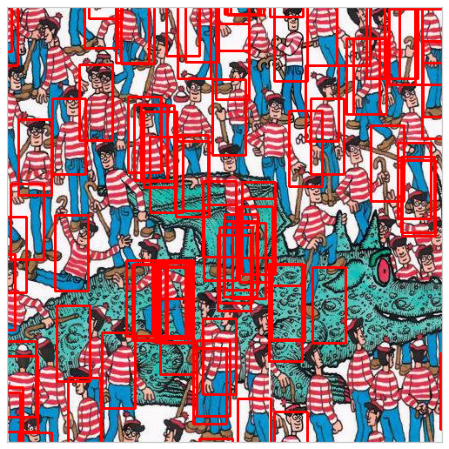

In [292]:
plt.figure(figsize=(16,8))
plt.imshow(draw[500:1000,500:1000,::-1])
plt.grid(False)
plt.xticks([])
plt.yticks([])